# Figure 4: MOSTA

Start with the measured MOSTA data and the trained model, then calculate and
draw the panels of Figure 4. Run this notebook from top to bottom. You do not
need to run the MOSTA dataset notebook first.

Panel a simulates cell populations. Panel b calculates communication and
ligand–receptor scores. Panel c follows individual simulated cells. Panels d
and e evaluate velocity on the observed cells used in the paper.

## Load the data and model

Run from the [CytoBridge code folder](../../installation.md). Set `project` to
your data directory. The first cell downloads missing data and model files.
The aligned data occupy about 15.5 GB. The calculations use a CUDA GPU.
All new results are saved under `outputs/figure4_from_model`, separately from
the downloaded inputs.

In [1]:
import os
import json
from pathlib import Path
import numpy as np
import pandas as pd
import anndata as ad
import CytoBridge as cb
from IPython.display import Image, display
from reproduction.mosta.main_figure import (
    PANELS, draw_main_figure, draw_interaction_maps, draw_cartilage, draw_brain_velocity,
)
from reproduction.mosta.calculations import (
    save_population_states, cartilage_lineage_inputs, calculate_velocity_panel, map_interaction_scores,
)
from reproduction.mosta.figures import style

project = Path(os.environ.get("CYTOBRIDGE_PROJECT_DIR", ".")).resolve()
inputs = project / "data/mosta"
model_dir = inputs / "model"
classifier_path = inputs / "classifier_cache/classifier_resmlp_6d2d7acf7d0ed92d.pt"
if not (inputs / "aligned.h5ad").is_file():
    cb.datasets.download("mosta", destination=project, kind="mosta_analysis_data.zip")
if not all(p.is_file() for p in (
    model_dir / "config.yaml", classifier_path, inputs / "edge_classifier/mosta_edge_model.pt",
)):
    cb.datasets.download("mosta", destination=project, kind="mosta_model.zip")
output = project / "outputs/figure4_from_model"
output.mkdir(parents=True, exist_ok=True)
device = "cuda"
style()
palette = json.loads((PANELS / "style_authority/label_to_color.json").read_text())

def show(paths):
    for path in paths:
        if Path(path).suffix == ".png":
            display(Image(filename=str(path), width=850))

In [2]:
reference = ad.read_h5ad(inputs / "aligned.h5ad")
frame, _ = cb.tl.adata_to_aligned_dataframe(
    reference, time_key="time_point_processed", obsm_key="X_latent",
    spatial_key="spatial_aligned", concat_spatial=True, annotation_key="Annotation",
)
loaded = cb.tl.load_dynamical_model_from_dir(
    model_dir, dim=52, device=device,
    edge_predictor_path=inputs / "edge_classifier/mosta_edge_model.pt",
)
runtime = cb.tl.build_dynamical_runtime(loaded)
classifier = cb.tl.load_cached_mlp_classifier(str(classifier_path), device=device)
times = [0., 0.5, 1., 1.5, 2., 2.5, 3.]
frame.groupby("samples").size().rename("Observed cells")

samples
0.0     51365
1.0     77369
2.0    102519
3.0    113350
Name: Observed cells, dtype: int64

## a. Spatial populations

Simulate from E12.5 with 50,000 initial particles, including growth. The
returned populations contain the observed cells at E12.5, E13.5, E14.5 and
E15.5, and simulated cells at E13, E14 and E15. The classifier assigns tissue
labels to the simulated cells. Coordinates are used directly.

Save these populations as `figure4a/slice_data/time_*.h5ad`. The next plotting
call reads those newly written files. It keeps the paper's frames and labels
and draws the cell layers from the new coordinates.

In [3]:
population_result = cb.tl.run_interpolation_workflow(
    df=frame, dim=52, annotation_key="Annotation", runtime=runtime,
    device=device, output_dir=str(output / "population_simulation"),
    requested_plot_points=times,
    interp_time_points=[t for t in times if t not in (0., 1., 2., 3.)],
    max_observed_timepoints=4, use_real_for_observed=True,
    classifier_cache_path=str(classifier_path), classifier_adata=reference,
    classifier_time_key="time_point_processed", classifier_obsm_key="X_latent",
    classifier_spatial_key="spatial_aligned", classifier_concat_spatial=True,
    classifier_strict_stratification=True, classifier_best_metric="bacc",
    classifier_knn_neighbors=10, sde_n_samples=50000,
    skip_nonsplit_sde=True, sde_dt=0.05, split_sde_dt=0.05,
    split_sigma_scalar=0.03, split_daughter_noise_std=0.0,
    split_growth_alpha=1.0, split_interaction_m=1024,
    split_resample_dt=None, split_max_particles=None,
    split_sde_piecewise=False, spatial_warp_to_observed=False,
    spatial_warp_to_observed_piecewise=False, slice_max_cells_per_timepoint=None,
    random_seed=42, separate_interaction_random_stream=True,
)

0.0     51365
0.5     63533
1.0     77369
1.5     86610
2.0    102519
2.5    100871
3.0    113350
Name: Cells, dtype: int64

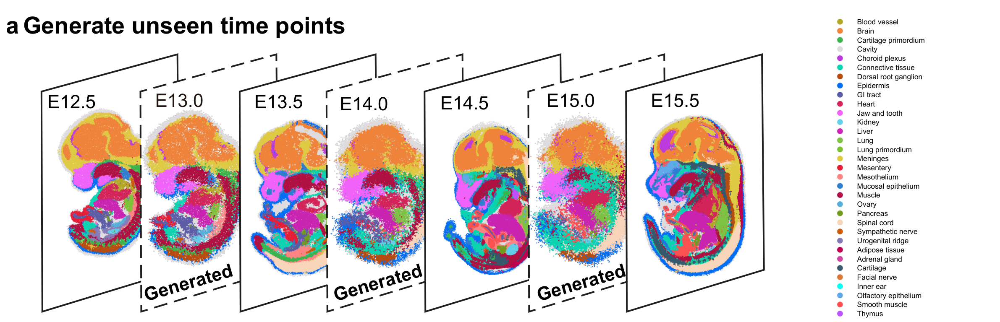

In [4]:
populations = population_result.adata_dict
save_population_states(populations, output / "populations/figure4a/slice_data")
display(pd.Series({t: a.n_obs for t, a in populations.items()}, name="Cells"))
show(draw_main_figure(output / "populations", output / "plots", panels="a")["a"])

## b. Wnt3a–Fzd7/Lrp6 interaction maps

The paper calculates these scores using a separate simulation with 12,000
initial particles, while displaying the larger population from panel a.
Run that simulation below, then calculate attention on its spatial neighbour
graph. `compute_timepoint_communications` sums attention by sender and receiver
cell type and returns the communication matrices.

`compute_focal_lr_type_hotspots` obtains expression from the observed data at
measured stages and from reconstructed PCA features at the simulated stage.
For each directed cell-type pair it multiplies mean Wnt3a expression, mean
receptor-complex expression and the communication weight `M_per_source`.
The receptor complex uses the minimum expression of Fzd7 and Lrp6.

Incoming and outgoing scores are summed for each cell type, then assigned to
that type's cells in panel a. Thus the map shows cell-type scores, not separate
measurements for individual cells. The table and map below use the same new
calculation. Cell types absent from the smaller calculation population retain
their coordinates and are shown in grey. Colours use the 1st–99th percentiles
separately at each time.

In [5]:
lr_grid = [float(t) for t in np.arange(0., 3.001, 0.25)]
lr_population_result = cb.tl.run_interpolation_workflow(
    df=frame, dim=52, annotation_key="Annotation", runtime=runtime,
    device=device, output_dir=str(output / "lr_population_simulation"),
    requested_plot_points=lr_grid,
    interp_time_points=[t for t in lr_grid if t not in (0., 1., 2., 3.)],
    max_observed_timepoints=4, use_real_for_observed=True,
    classifier_cache_path=str(classifier_path), classifier_adata=reference,
    classifier_time_key="time_point_processed", classifier_obsm_key="X_latent",
    classifier_spatial_key="spatial_aligned", classifier_concat_spatial=True,
    classifier_strict_stratification=True, classifier_best_metric="bacc",
    classifier_knn_neighbors=10, sde_n_samples=12000,
    skip_nonsplit_sde=True, sde_dt=0.05, split_sde_dt=0.05,
    split_sigma_scalar=0.03, split_daughter_noise_std=0.0,
    split_growth_alpha=1.0, split_interaction_m=1024,
    split_resample_dt=None, split_max_particles=None,
    split_sde_piecewise=False, spatial_warp_to_observed=False,
    spatial_warp_to_observed_piecewise=False, slice_max_cells_per_timepoint=None,
    random_seed=42, separate_interaction_random_stream=True,
)

,time,pair_id,ligand,receptor,pair,cell_type,ligand_mean_as_sender,receptor_mean_as_receiver,incoming,outgoing,total,n_cells,n_compute_cells,n_display_cells,expression_supported_as_sender,expression_supported_as_receiver
0,0.0,"[""Wnt3a"",""Fzd7_Lrp6""]",Wnt3a,Fzd7_Lrp6,Wnt3a_Fzd7_Lrp6,Choroid plexus,0.177198,0.068115,0.224738,0.357640,0.582378,462,462,462,True,True
1,0.0,"[""Wnt3a"",""Fzd7_Lrp6""]",Wnt3a,Fzd7_Lrp6,Wnt3a_Fzd7_Lrp6,Epidermis,0.033055,0.205727,0.127331,0.187856,0.315187,1433,1433,1433,True,True
2,0.0,"[""Wnt3a"",""Fzd7_Lrp6""]",Wnt3a,Fzd7_Lrp6,Wnt3a_Fzd7_Lrp6,Meninges,0.004668,0.094153,0.117590,0.014653,0.132243,5353,5353,5353,True,True
3,0.0,"[""Wnt3a"",""Fzd7_Lrp6""]",Wnt3a,Fzd7_Lrp6,Wnt3a_Fzd7_Lrp6,Jaw and tooth,0.005177,0.218674,0.071489,0.057555,0.129044,2651,2651,2651,True,True
4,0.0,"[""Wnt3a"",""Fzd7_Lrp6""]",Wnt3a,Fzd7_Lrp6,Wnt3a_Fzd7_Lrp6,Cartilage primordium,0.002320,0.264316,0.039643,0.028917,0.068560,3670,3670,3670,True,True


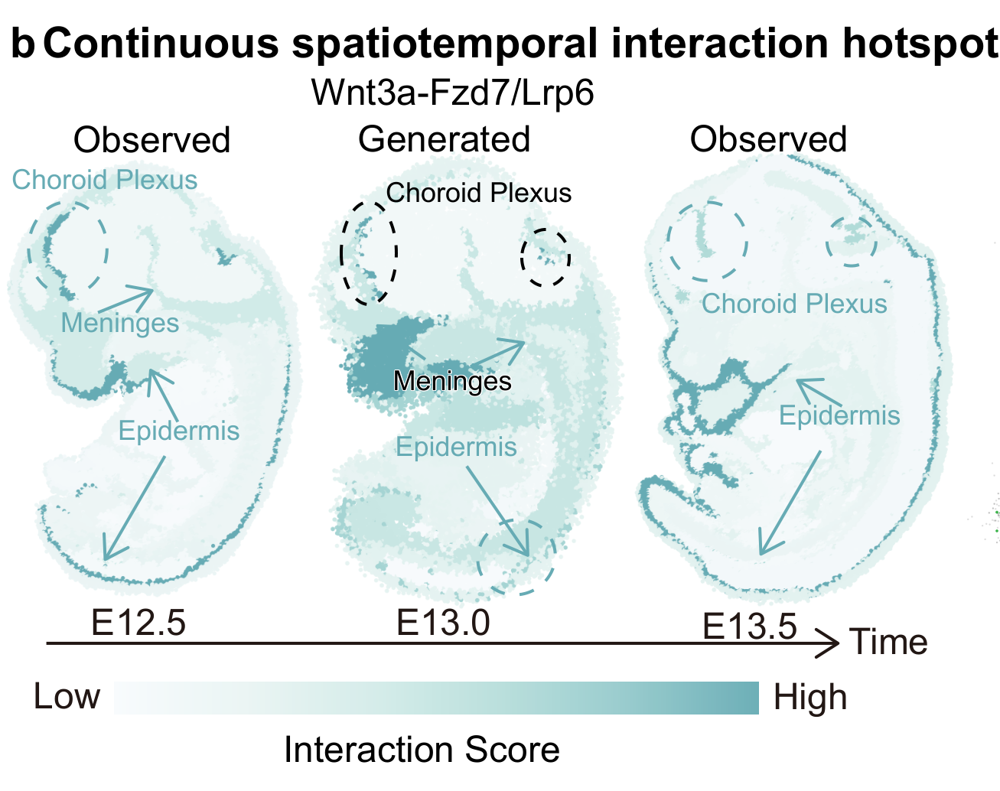

In [6]:
lr_times = [0., 0.5, 1.]
compute_populations = {str(t): lr_population_result.adata_dict[str(t)] for t in lr_times}
communications = cb.tl.compute_timepoint_communications(
    adata_dict=compute_populations, time_points=lr_times, annotation_key="Annotation",
    f_net=runtime.f_net, device=device, out_dir=str(output / "communication"),
    remove_self_loop=False, winsor_quantile=0.995, max_cells_per_timepoint=None,
)
lr = cb.tl.compute_focal_lr_type_hotspots(
    compute_populations, reference, communications,
    ligand="Wnt3a", receptor="Fzd7_Lrp6", time_points=lr_times,
    annotation_key="Annotation", matrix_key="M_per_source", spatial_key="spatial",
    spatial_dim=2, loadings_key="PCs", expression_space="log1p",
    complex_mode="min", require_all_subunits=True, preferred_species_tag="mouse",
    observed_adata=reference, observed_time_points=[0., 1., 2., 3.],
    observed_annotation_key="Annotation", observed_expression_space="log1p",
)
cells_to_plot = pd.concat([
    pd.DataFrame({"time": t, "cell_type": populations[str(t)].obs["Annotation"].astype(str).to_numpy(),
                  "x": populations[str(t)].X[:, 0], "y": populations[str(t)].X[:, 1]})
    for t in lr_times
], ignore_index=True)
mapping = map_interaction_scores(cells_to_plot, lr.type_scores)
lr.type_matrix.to_csv(output / "type_matrix.csv", index=False)
lr.type_scores.to_csv(output / "type_scores.csv", index=False)
mapping.to_csv(output / "cell_mapping.csv.gz", index=False)
display(lr.type_scores.head())
show(draw_interaction_maps(output, output / "plots", mapping=mapping))

## c. Cartilage lineage

Use a fixed-particle trajectory to keep each particle's identity across time.
This calculation follows the paper's deterministic trajectories, with diffusion
and the score term disabled. It is separate from the growing populations in
panel a.

Classify the trajectories, select cartilage-primordium particles at E15, and
find the labels of the same particles at E15.5. Count those labels and divide
by the number selected. `cartilage_lineage_inputs` selects these rows and adds
the observed E15.5 coordinates as the background. The plot uses that returned
dictionary directly.

,cells,fraction
cell_type,,
Cartilage primordium,941,0.642760
Cartilage,407,0.278005
Connective tissue,44,0.030055


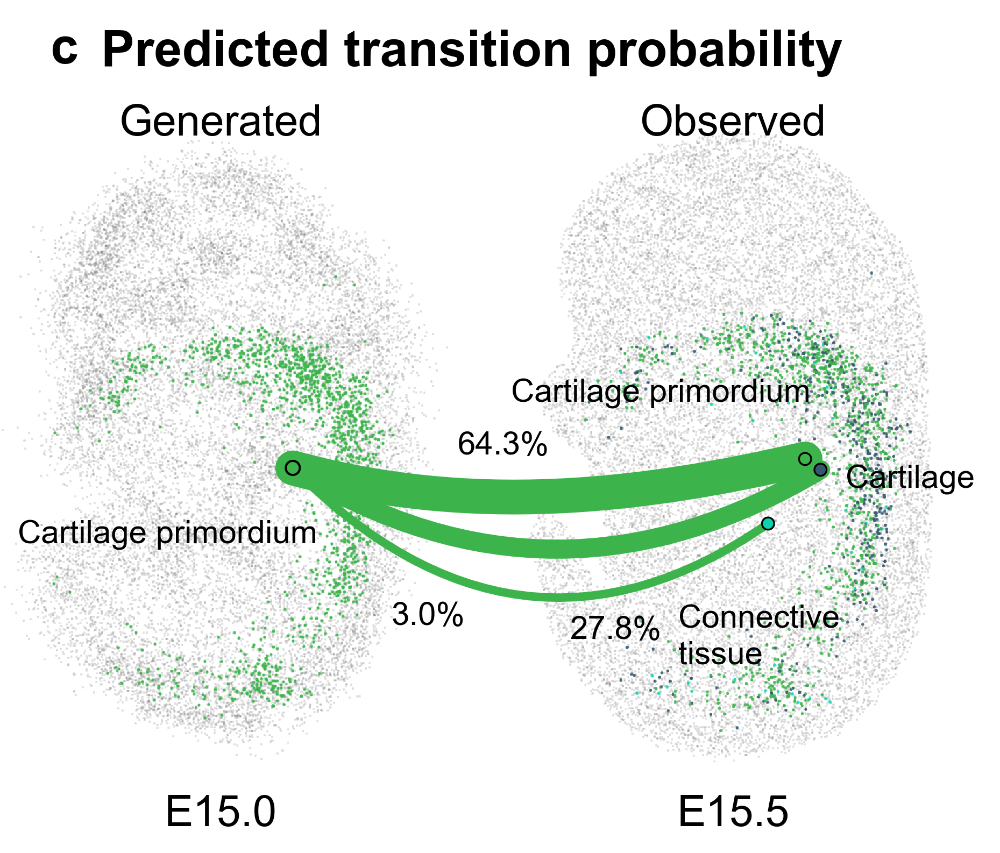

In [7]:
cb.tl.set_global_random_seed(42)
states, weights = cb.tl.simulate_sde_points(
    df=frame, dim=52, f_net=runtime.f_net, score_net=runtime.score_net,
    time_index=0, n_samples=50000, ts_points=times, dt=0.05,
    sigma=0.0, include_score=False, interaction_m=1024,
    device=device, interaction_seed=10042,
)
labels = cb.tl.predict_labels_for_trajectories(
    sde_points=states, ts_points=times, model=classifier.model,
    label_encoder=classifier.label_encoder, feature_dim=classifier.feature_dim,
    device=device, knn_neighbors=1, include_time_feature=classifier.include_time_feature,
    feature_indices=None, spatial_indices=(0, 1),
)
lineage = cartilage_lineage_inputs(states, labels, times, reference)
np.savez_compressed(output / "cartilage_lineage.npz", **lineage)
counts = pd.Series(lineage["target_labels"]).value_counts()
fractions = pd.DataFrame({"cells": counts, "fraction": counts / counts.sum()})
fractions.to_csv(output / "cartilage_lineage_fractions.csv")
display(fractions.head(3))
show(draw_cartilage(output / "plots", palette, arrays=lineage))

## d. Interaction-induced gene velocity

Evaluate the model on the 8,000 observed E15.5 cells used in the paper.
The included `fig4d/evidence/numeric_inputs.npz` supplies their measured state
features, coordinates and annotations. It defines which observed cells to use.
`calculate_velocity_panel` calls `compute_velocity_components` to calculate
the model fields, then `compute_timepoint_communications` on the same cells.
It projects the 50-dimensional interaction gene velocity onto space using
a 30-neighbour graph. The new velocity arrays and communication table are
passed directly to the plot.

  0%|          | 0/8000 [00:00<?, ?cells/s]

  0%|          | 0/8000 [00:00<?, ?cells/s]

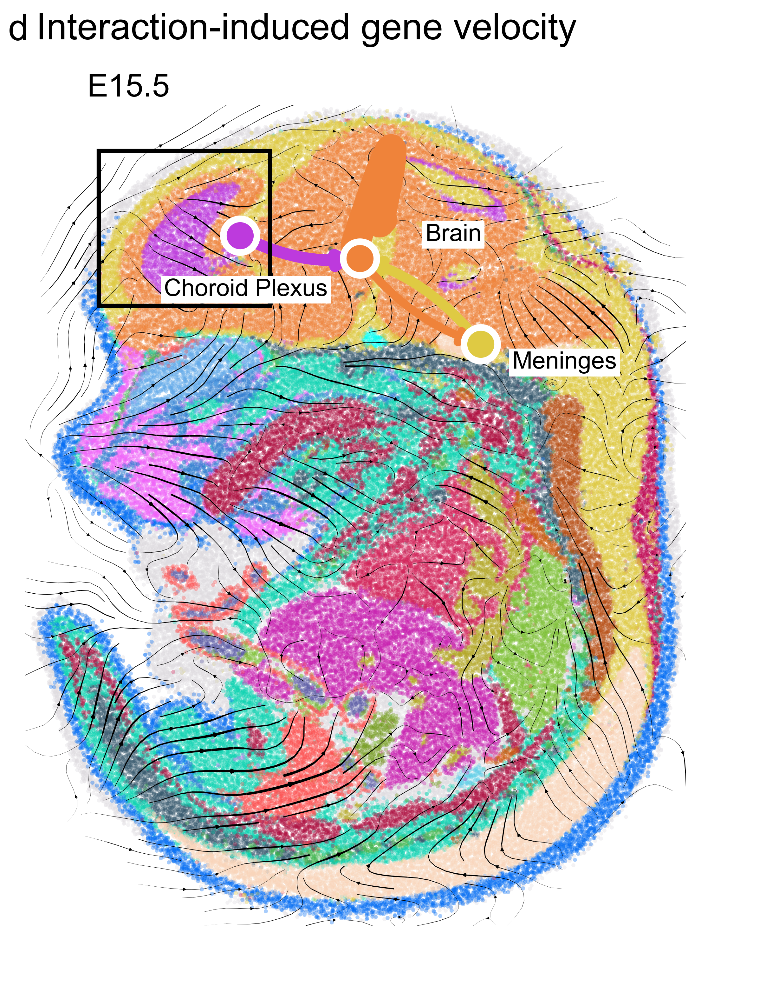

In [8]:
from reproduction.mosta.interaction_velocity import draw_interaction_velocity

numeric_d = calculate_velocity_panel(model_dir, output / "calculated_d", "d", device=device, overwrite=True)
show(draw_interaction_velocity(
    numeric_d, numeric_d.parent / "communication_all_type_edges.csv.gz", palette, output / "plots",
))

## e. Brain velocity fields

The included panel-e input contains the 17,071 observed E15.5 Brain cells and
their anatomical labels. Evaluate the model with interaction group size
1,024, then project gene derivatives before selecting the displayed region.
The four maps compare full and interaction velocity in gene and spatial
dimensions. The plotted region is −1.3 < x < −0.5 and 3.3 < y < 4.2.

  0%|          | 0/17071 [00:00<?, ?cells/s]

  0%|          | 0/17071 [00:00<?, ?cells/s]

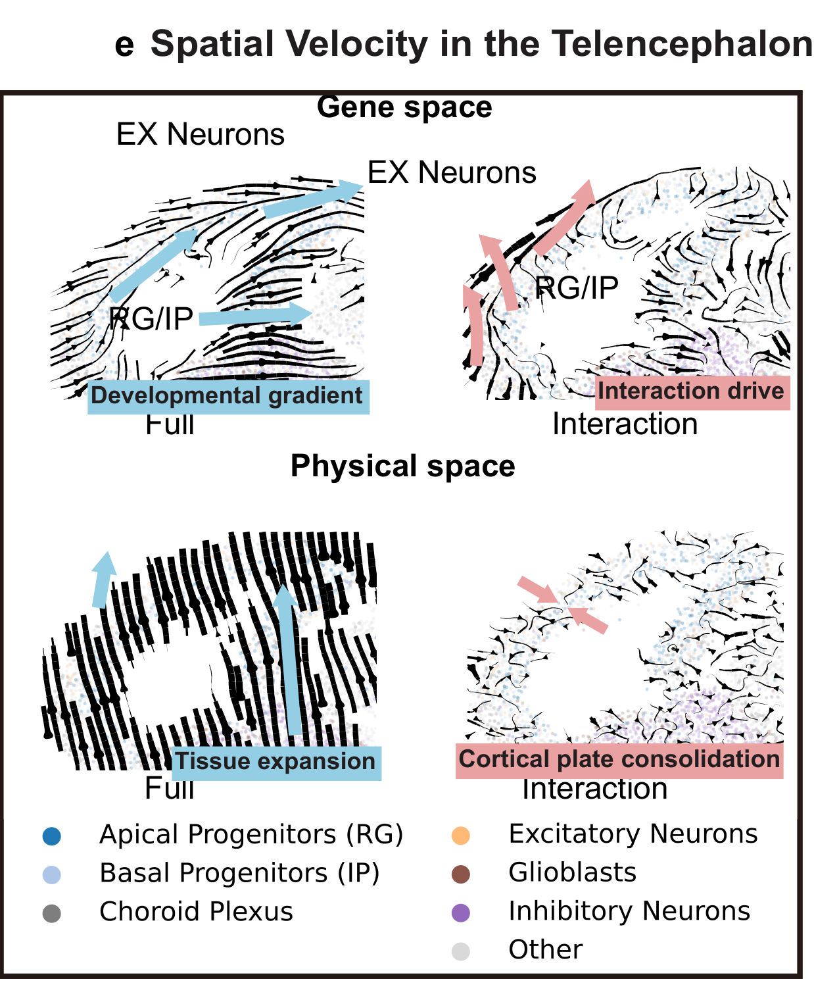

In [9]:
numeric_e = calculate_velocity_panel(model_dir, output / "calculated_e", "e", device=device, overwrite=True)
show(draw_brain_velocity(output / "plots", numeric_path=numeric_e))